In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [22]:
import pandas as pd
data=pd.read_csv("./sms-call-internet-mi-2013-11-08.txt",sep='\t',header=None)
data = data.fillna(0)
data.columns = ['cell_id','time_stp','country_code','SMS_in','SMS_out','Call_in','Call_out','Internet']
data.head()


,cell_id,time_stp,country_code,SMS_in,SMS_out,Call_in,Call_out,Internet
0,1,1383865200000,39,0.518794,0.245790,0.053438,0.108039,10.296910
1,1,1383865800000,0,0.027300,0.000000,0.000000,0.000000,0.000000
2,1,1383865800000,33,0.000000,0.000000,0.027300,0.000000,0.000000
3,1,1383865800000,39,0.122337,0.138375,0.027925,0.000000,7.384440
4,1,1383866400000,39,0.238187,0.191813,0.001787,0.052275,8.531256


In [51]:
""" data = data.fillna(0) """

# time stamps range
max_time_stp = data['time_stp'].max()
min_time_stp = data['time_stp'].min()
print(max_time_stp,min_time_stp)

# country_code range
user_code = data['country_code'].astype("category")
user_code.describe()
cell_ids = data['cell_id']
cell_ids.describe()



1383951000000 1383865200000


count    3.335568e+06
mean     3.551817e+03
std      1.721405e+03
min      1.000000e+00
25%      2.150000e+03
50%      3.735000e+03
75%      5.063000e+03
max      1.000000e+04
Name: cell_id, dtype: float64

In [24]:
# 以cell_id为对象分割数据集
grouped_data = data.groupby('cell_id')

for cell_id, group in grouped_data:
    print("Grouped cell_id:", cell_id)
    print(group)
    print("-----------------")

Grouped cell_id: 1
     cell_id       time_stp  country_code    SMS_in   SMS_out   Call_in  \
0          1  1383865200000            39  0.518794  0.245790  0.053438   
1          1  1383865800000             0  0.027300  0.000000  0.000000   
2          1  1383865800000            33  0.000000  0.000000  0.027300   
3          1  1383865800000            39  0.122337  0.138375  0.027925   
4          1  1383866400000            39  0.238187  0.191813  0.001787   
..       ...            ...           ...       ...       ...       ...   
410        1  1383949800000            39  0.379427  0.199587  0.106876   
411        1  1383950400000             0  0.136588  0.000000  0.000000   
412        1  1383950400000            39  0.412628  0.330103  0.027925   
413        1  1383950400000            46  0.000000  0.000000  0.000000   
414        1  1383951000000            39  0.252315  0.304590  0.055225   

     Call_out   Internet  
0    0.108039  10.296910  
1    0.000000   0.000000  

In [25]:
""" data['time_stp'] = pd.to_datetime(data['time_stp'])  # 将时间戳列转换为时间格式 """
cdr_data = data.groupby(['cell_id', 'time_stp'], as_index=False).sum()
cdr_data.to_csv('./merged_dataset.txt', index=False)
cdr_data.head()

,cell_id,time_stp,country_code,SMS_in,SMS_out,Call_in,Call_out,Internet
0,1,1383865200000,39,0.518794,0.245790,0.053438,0.108039,10.296910
1,1,1383865800000,72,0.149638,0.138375,0.055225,0.000000,7.384440
2,1,1383866400000,85,0.238187,0.191813,0.001787,0.052275,8.557394
3,1,1383867000000,39,0.220901,0.190564,0.079575,0.027300,8.220313
4,1,1383867600000,39,0.192976,0.206026,0.057013,0.000000,8.069304


In [50]:
# transfer date time
import datetime
data_nocc = data.drop(columns=['country_code'])
# Convert time stamps in milliseconds to seconds
data_nocc['time_stp_seconds'] = data_nocc['time_stp'] / 1000

# Create 'datetime' objects from the time stamps in seconds
data_nocc['datetime_object'] = data_nocc['time_stp_seconds'].apply(datetime.datetime.fromtimestamp)

# Format the 'datetime' objects as strings in the desired format
data_nocc['formatted_time'] = data_nocc['datetime_object'].apply(lambda x: x.strftime('%Y-%m-%d %H:%M:%S'))

data_nocc = data_nocc.groupby(['cell_id', 'formatted_time'], as_index=False).sum()
data_nocc['dt_obj'] = pd.to_datetime(data_nocc['formatted_time'])
# Extract the hour and minute from the 'datetime' objects and create new labels for them
data_nocc['hour'] = data_nocc['dt_obj'].dt.hour
data_nocc['minute'] = data_nocc['dt_obj'].dt.minute

# Drop unnecessary columns (if needed)
data_nocc.drop(['time_stp', 'time_stp_seconds','dt_obj'], axis=1, inplace=True)


data_nocc.to_csv('./merged_dataset_nocc.txt', index=False)
data_nocc.head()
#print(data_nocc['time_stp'])

/tmp/ipykernel_32639/3279829068.py:13: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data_nocc = data_nocc.groupby(['cell_id', 'formatted_time'], as_index=False).sum()


,cell_id,formatted_time,SMS_in,SMS_out,Call_in,Call_out,Internet,hour,minute
0,1,2013-11-08 00:00:00,0.518794,0.245790,0.053438,0.108039,10.296910,0,0
1,1,2013-11-08 00:10:00,0.149638,0.138375,0.055225,0.000000,7.384440,0,10
2,1,2013-11-08 00:20:00,0.238187,0.191813,0.001787,0.052275,8.557394,0,20
3,1,2013-11-08 00:30:00,0.220901,0.190564,0.079575,0.027300,8.220313,0,30
4,1,2013-11-08 00:40:00,0.192976,0.206026,0.057013,0.000000,8.069304,0,40


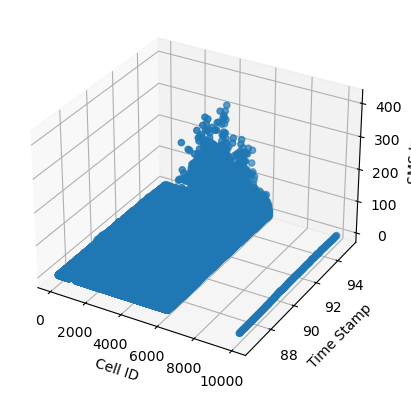

In [20]:
from mpl_toolkits.mplot3d import Axes3D
""" aggregated_data = data.groupby(['cell_id', 'time_stp'])['SMS_in'].sum().reset_index() """

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Extract the dimensions for the plot
cell_ids = cdr_data['cell_id']
timestamps = cdr_data['time_stp']
sms_in_values = cdr_data['SMS_in']

# Plot the data points
ax.scatter(cell_ids, timestamps, sms_in_values)

# Set labels for each axis
ax.set_xlabel('Cell ID')
ax.set_ylabel('Time Stamp')
ax.set_zlabel('SMS In')

# Show the plot
plt.show()

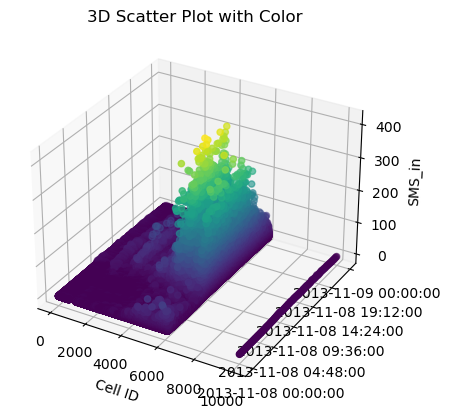

In [54]:
import matplotlib.dates as mdates
import matplotlib.ticker as ticker
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

cell_ids = data_nocc['cell_id']
time_stamps = data_nocc['formatted_time']
time_stamps = pd.to_datetime(time_stamps)
time_stamps = mdates.date2num(time_stamps)
colors = data_nocc['SMS_in']  # 用SMS_in列的值作为颜色

ax.scatter(cell_ids, time_stamps, colors, c=colors, cmap='viridis', marker='o')
ax.set_xlabel('Cell ID')
#ax.set_ylabel('Time Stamp')
ax.yaxis.set_major_locator(ticker.AutoLocator())
ax.yaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M:%S'))
ax.set_zlabel('SMS_in')
ax.set_title('3D Scatter Plot with Color')

plt.show()


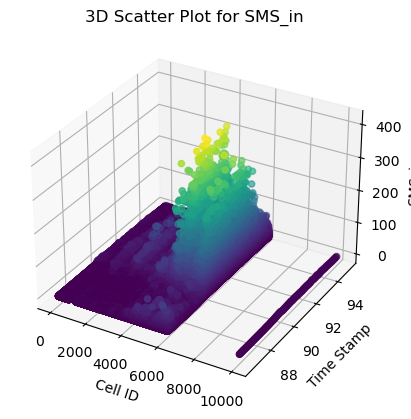

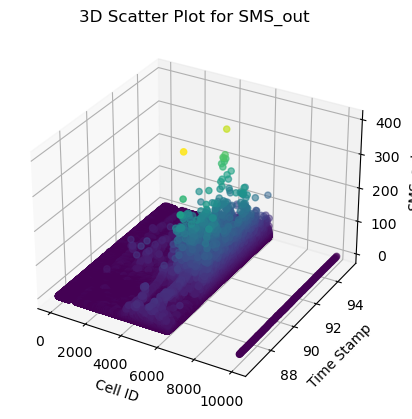

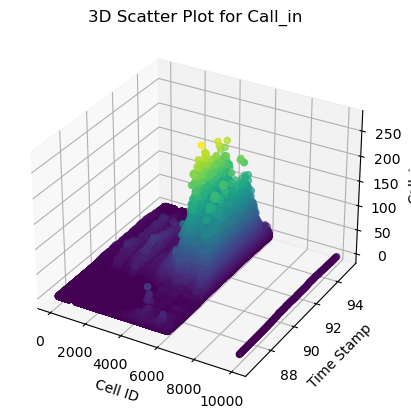

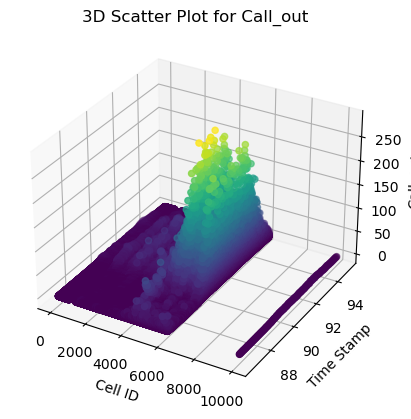

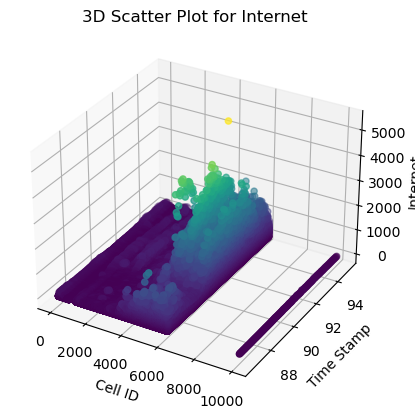

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 读取处理后的CDR数据集
cdr_data = pd.read_csv('merged_dataset.txt')

# 创建绘图函数
def plot_3d(col_name):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    cell_ids = cdr_data['cell_id']
    time_stamps = cdr_data['time_stp']
    values = cdr_data[col_name]  # 获取指定列的值

    ax.scatter(cell_ids, time_stamps, values, c=values, cmap='viridis', marker='o')

    ax.set_xlabel('Cell ID')
    ax.set_ylabel('Time Stamp')
    ax.set_zlabel(col_name)
    ax.set_title(f'3D Scatter Plot for {col_name}')
    
    plt.show()

# 分别绘制不同列的3D图
plot_3d('SMS_in')
plot_3d('SMS_out')
plot_3d('Call_in')
plot_3d('Call_out')
plot_3d('Internet')


In [36]:
# load data as nodes or edges

import torch
import pandas as pd

# Encoding function：data -> tensor
def identity_encoder(data):
    return torch.tensor(data.values, dtype=torch.float32)


def load_node_file(path, index_col, encoders=None, **kwargs):
    df = pd.read_csv(path, index_col=index_col, **kwargs)
    mapping = {index: i for i, index in enumerate(df.index.unique())}

    x = None
    if encoders is not None:
        xs = [encoder(df[col]) for col, encoder in encoders.items()]
        x = torch.cat(xs, dim=-1)

    return x, mapping


def load_edge_csv(path, src_index_col, src_mapping, dst_index_col, dst_mapping,
                  encoders=None, **kwargs):
    df = pd.read_csv(path, **kwargs)

    src = [src_mapping[index] for index in df[src_index_col]]
    dst = [dst_mapping[index] for index in df[dst_index_col]]
    edge_index = torch.tensor([src, dst])

    edge_attr = None
    if encoders is not None:
        edge_attrs = [encoder(df[col]) for col, encoder in encoders.items()]
        edge_attr = torch.cat(edge_attrs, dim=-1)

    return edge_index, edge_attr

# load data and encode
data_path = './merged_dataset.txt'
index_col_name = 'cell_id'
encoder_functions = {'SMS_in': identity_encoder, 'SMS_out': identity_encoder, 'Call_in': identity_encoder, 'Call_out': identity_encoder, 'Internet': identity_encoder, 'time_stp': identity_encoder}
Cell_x, Cell_mapping = load_node_file(data_path, index_col=index_col_name,encoders=encoder_functions)

""" print("Encoded Data (x):")
print(x)

print("\nIndex Mapping:")
print(mapping) """

' print("Encoded Data (x):")\nprint(x)\n\nprint("\nIndex Mapping:")\nprint(mapping) '